# *Optical Tweezers* | Lab-Session #7
## Feb-22-2021 13:45

Everything you need to know about QPD Calibration in multiple axes

In [1]:
# Import the relevant libraries
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt 
import scipy.constants as consts
import os
from csvlib import *
from scipy.optimize import curve_fit
from scipy.signal import butter, lfilter, freqz
# plt.style.use('classic')


# Display mpl in notebook format
%matplotlib inline

# Data Collection

In [2]:
# open CSV files to numpy array
csvs = list_csv(PRINT='True')   # Lists CSV files in a given directory
DATA = pd.read_csv(csvs[1])     # Gets the CSV file as a Pandas Data Frame
data = DATA.to_numpy().T        # Gets data as a numpy array
DATA                            # Prints pretty PANDAS data frame

# This will get an interval of data based on a timestamp
def get_index(array,value):
    idx = np.searchsorted(array, value, side="left")
    if idx > 0 and (idx == len(array) or abs(value - array[idx-1]) < abs(value - array[idx])):
        return idx-1
    else:
        return idx

def get_interval(t0,t1,time,arrays):
    i0 = get_index(time,t0)
    i1 = get_index(time,t1)
    a = []
    a.append(np.array(time[i0:i1]))
    for A in arrays:
        a.append(np.array(A[i0:i1]))
    
    return a

def get_pair_interval(t0,t1,pairs,time):
    return np.array([pair for pair in pairs if time[pair[0]] >= t0 and time[pair[1]] <= t1])

List of .csv files in .
	 0 : FEB-22-2021 (root).csv
	 1 : QPD_CAL_X_100_2_10.csv
	 2 : QPD_CAL_X_150_2_10.csv
	 3 : QPD_CAL_X_200_2_10.csv
	 4 : QPD_CAL_X_250_2_10.csv
	 5 : QPD_CAL_X_300_2_10.csv
	 6 : QPD_CAL_Y_100_2_10 #1.csv
	 7 : QPD_CAL_Y_100_2_10.csv
	 8 : QPD_CAL_Y_150_2_10.csv
	 9 : QPD_CAL_Y_200_2_10.csv
	 10 : QPD_CAL_Y_250_2_10.csv
	 11 : QPD_CAL_Y_300_2_10.csv


# Data Analysis

(<Figure size 1152x720 with 3 Axes>,
 <AxesSubplot:title={'center':'Stage Motion'}, ylabel='X-Voltage $V_x\\ [V]$'>,
 <AxesSubplot:title={'center':'QPD Reading'}, xlabel='Time $t\\ [s]$', ylabel='Voltage $V\\ [V]$'>)

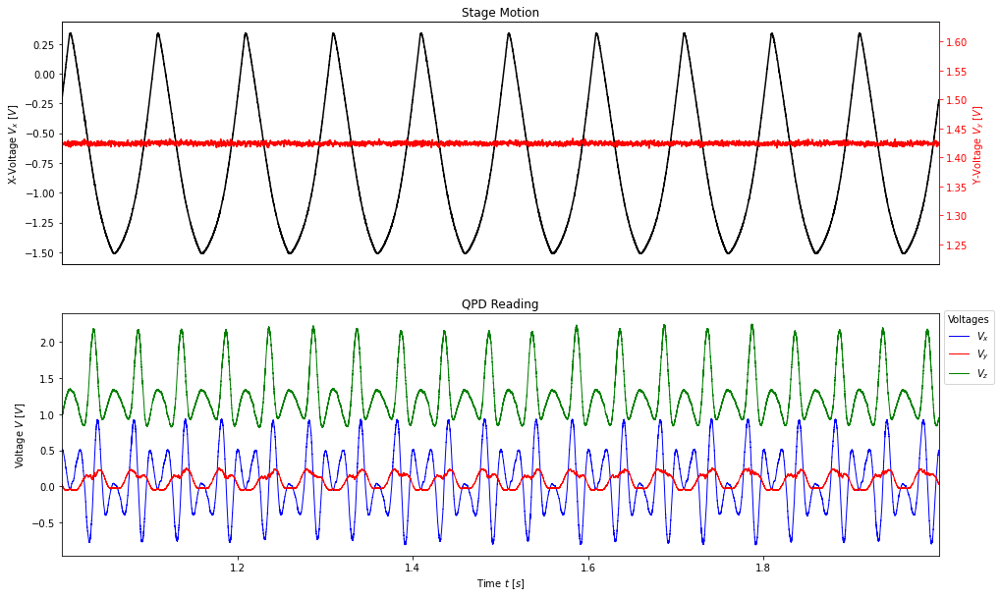

In [3]:
# Plot the run data

# Select a data point
DATA = pd.read_csv(csvs[1])         # Gets the CSV file as a Pandas Data Frame
data = DATA.to_numpy().T            # Gets data as a numpy array

# Get the variables
time    = np.linspace(0,5,len(data[0]))
stage_x = data[3]
stage_y = data[4]
x_raw   = data[0]
y_raw   = data[1]
z_raw   = data[2]

# pick a time interval
t0 = 1.0
t1 = 2.0
t, x, y, z, x_stg, y_stg = get_interval(t0, t1, time, [x_raw, y_raw, z_raw, stage_x, stage_y])

def plot(t0=t0,t1=t1,time=time,x_raw=x_raw,y_raw=y_raw,z_raw=z_raw,stage_x=stage_x,stage_y=stage_y):
    # pick a time interval
    t, x, y, z, x_stg, y_stg = get_interval(t0, t1, time.tolist(), [x_raw.tolist(), y_raw.tolist(), z_raw.tolist(), stage_x.tolist(), stage_y.tolist()])


    # Create the figure
    fig = plt.figure(figsize = (16,10), constrained_layout = False)
    gs = fig.add_gridspec(2,1)          # Defines hte grid

    # Plot the stage voltage ########################################
    ax_stg = fig.add_subplot(gs[0,0])
    ax_stg.set_title('Stage Motion')
    ax_stg.set_xlim(min(t),max(t))

    # Plot V_x
    ax_stg.plot(t,x_stg,c='k')
    ax_stg.set_ylabel(r'X-Voltage $V_x\ [V]$')
    ax_stg.get_xaxis().set_visible(False)

    #Plot V_y
    ax_stgy = ax_stg.twinx()
    ax_stgy.plot(t,y_stg,c='r')
    scale_y = 0.2
    ax_stgy.set_ylim(min(stage_y)-scale_y,max(stage_y)+scale_y)

    ax_stgy.spines['right'].set_color('red')
    ax_stgy.tick_params(axis='y', colors ='red')
    ax_stgy.set_ylabel(r'Y-Voltage $V_y\ [V]$',c='red')


    # Plot QPD Signal ###############################################
    ax_qpd = fig.add_subplot(gs[1,0],sharex = ax_stg)
    ax_qpd.set_title('QPD Reading')
    ax_qpd.set_xlabel(r'Time $t\ [s]$')
    ax_qpd.set_ylabel(r'Voltage $V\ [V]$')

    ax_qpd.plot(t,x,c='b',label=r'$V_x$',lw=1)
    ax_qpd.plot(t,y,c='r',label=r'$V_y$',lw=1)
    ax_qpd.plot(t,z,c='g',label=r'$V_z$',lw=1)

    ax_qpd.legend(title='Voltages', bbox_to_anchor=(1., 1.03), loc='upper left')

    return fig,ax_stg,ax_qpd

plot()

# Identifying the flat regions

The procedure is as follows
-   Filter the data
-   Estimate the derivate pointwise, through linear differentiators
-   Flatten the data with some Filter
-   Identify the regions within our limit
-   Cut the data in the appropriate places
-   Supperpose and average in order to obtain statistical things

(<Figure size 1152x720 with 3 Axes>,
 <AxesSubplot:title={'center':'Stage Motion'}, ylabel='X-Voltage $V_x\\ [V]$'>,
 <AxesSubplot:title={'center':'QPD Reading'}, xlabel='Time $t\\ [s]$', ylabel='Voltage $V\\ [V]$'>)

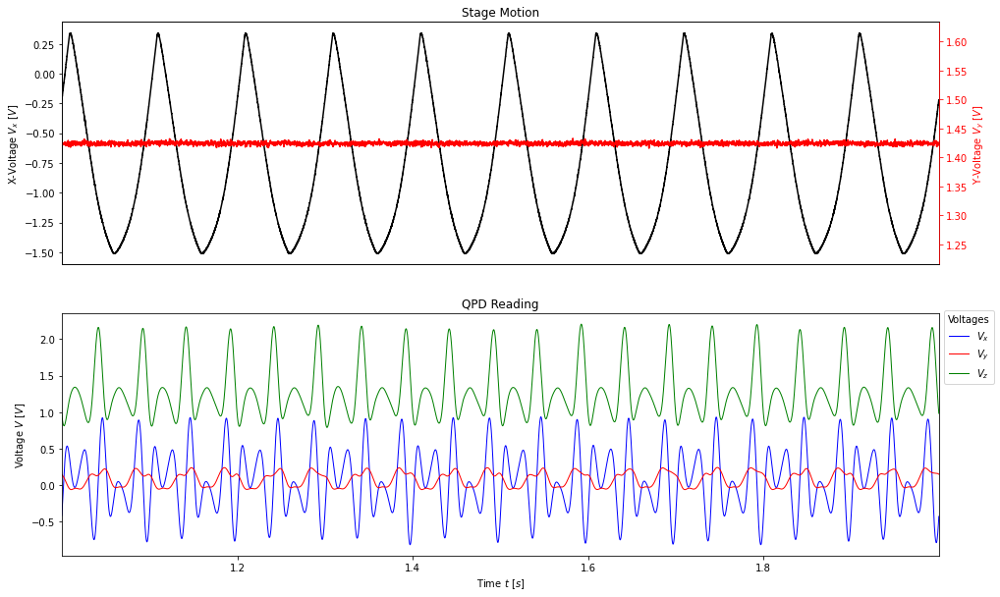

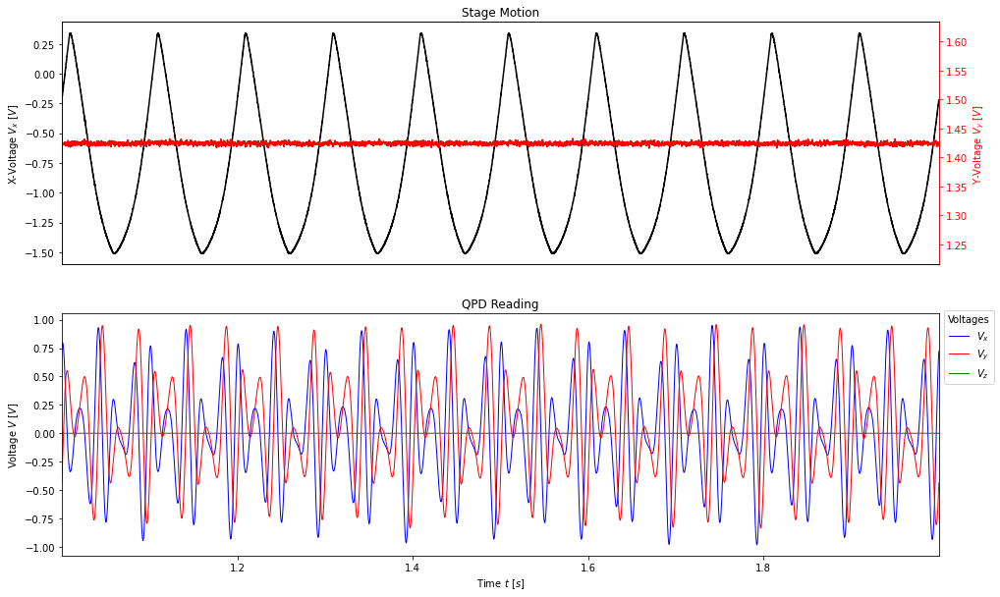

In [4]:
# Filter 1 ##############################################

# We first pass through a low pass filter
# Butterworth Filter
def butter_lowpass_filter(data, cutoff, fs, order=5):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    y = lfilter(b, a, data)
    return y

# Filter parameters
fs = len(time)/(max(time)-min(time))     # Sampling Frequency
fc = 100                                 # Cutoff frequency
order = 1                                # Order

# Pass everything through the filter
x1 = butter_lowpass_filter(x_raw,fc,fs)
y1 = butter_lowpass_filter(y_raw,fc,fs)
z1 = butter_lowpass_filter(z_raw,fc,fs)
plot(x_raw=x1,y_raw=y1,z_raw=z1)



# Derivative Estimation #####################################

# We will now pass everything through a differentiator circuit. 

def derivative(data,fs=fs):
    shifted_data = data.tolist()[1:len(data)]   # Shift the data by one
    shifted_data.append(data[0])                # Append the last elements to keep dimensions equal
    shifted_data = np.array(shifted_data)       # Make it a numpy

    derivative = (shifted_data - data)*fs       # Calculate the difference

    return derivative

# Calculate the derivatives and normalize
x2 = derivative(x1)
x2/=max(x2[1:len(x2)-1])

y2 = derivative(y1)
y2/=max(y2[1:len(y2)-1])

z2 = derivative(z1)
z2/=max(z2[1:len(z2)-1])

plot(x_raw=x2,y_raw=x1/max(x1),z_raw=z2*0)

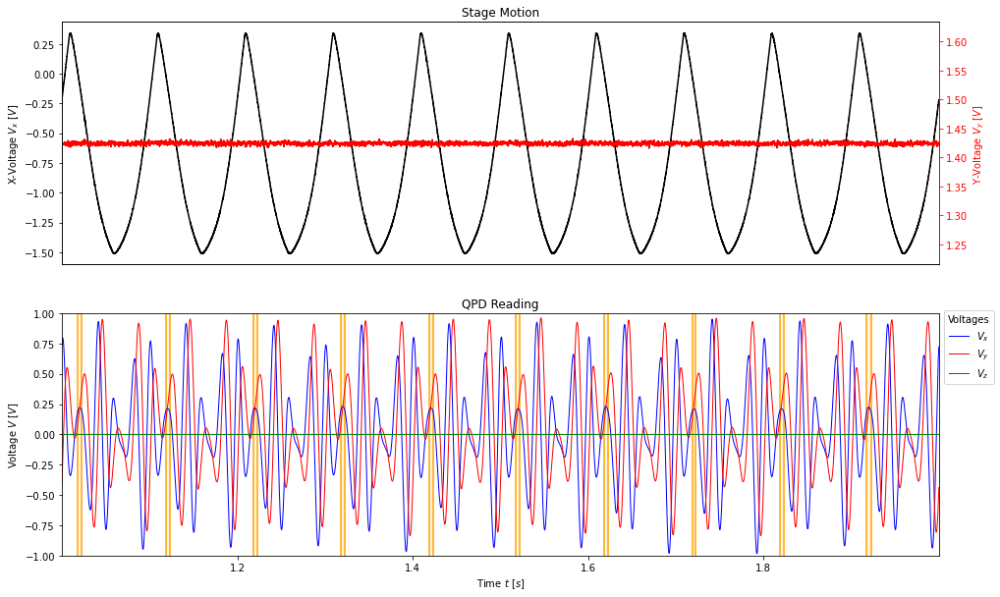

In [5]:
# Identifying the areas of flatness #####################################

# This will return a set of pair witch will be all segments above the limit or below the limit depending on the trigger mode.
def intersection_points(in_data,limit,trigger='rising'):
    data = in_data - limit
    indx = []
    rising = (trigger == 'rising') # is the next one I am expecting rising?
    pair = []
    intcnt = 0
    for i in range(len(data)-1):
        if data[i]*data[i+1] <= 0:
            intcnt += 1
            
            if rising == (data[i] < data[i+1]):
                rising = not rising
                if len(pair) == 0:
                    pair.append(i)
                else:
                    pair.append(i)
                    indx.append(pair)
                    pair = []
    return np.array(indx)

# This function will receive the set of pairs and it will select the ones who's time separation is within a predefined range Dt.
def filter_time(time,pairs,Dt=1,tolerance=0.1):
    return np.array([pair for pair in pairs if abs(time[pair[1]]-time[pair[0]] - Dt) < tolerance])

# Receives a set of pairs and will select the ones who do not cross a specific amplitude
def filter_amplitude(data,pairs,DA=1, tolerance = 0.1):
    return np.array([pair for pair in pairs if abs(max(data[pair[0]:pair[1]]) - DA) < tolerance])

# Now let's select the appropriate regions
pairs_rising = intersection_points(x2,limit=0.19,trigger='rising')
pairs_rising = filter_time(time,pairs_rising,Dt=0.005,tolerance=0.005)
pairs_rising = filter_amplitude(x2,pairs_rising,DA=0.22,tolerance=0.03)
# Finally let's plot
fig, ax_stg,ax_qpd = plot(x_raw=x2,y_raw=x1/max(x1),z_raw=z2*0)
ax_qpd.set_ylim(-1,1)


# Shade the identified region
pairs = get_pair_interval(t0,t1,pairs_rising,time)
ax_qpd.vlines(time[pairs.flatten()],-1,1,color='orange')
for pair in pairs:
    ax_qpd.axvspan(time[pair[0]],time[pair[1]],color='orange',alpha = 0.1)


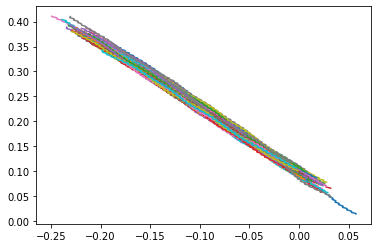

In [6]:
# Now we will snip snip the data to do this we are going to superpose them
# Returns an array of arrays where each has the frequency data. 
def superpose(data,pairs):
    return np.array([data[pair[0]:pair[1]] for pair in pairs])

# print(len(x_stg))
v_qpd = superpose(x1,    pairs_rising)
v_stg = superpose(stage_x, pairs_rising)

for i in range(len(pairs_rising)):
    plt.plot(v_stg[i],v_qpd[i])


In [7]:
# Now let's put everything in one function.
# This function will take in a data set and split it it's equivalent superpositions

def split(data_qpd,data_stg,time,fc=100,order=1,grad_min = 0.19, grad_max = 0.25, time_max=0.001, time_min = 0):
    # Filter out the high frequencies
    # Filter parameters
    fs = len(time)/(max(time)-min(time))     # Sampling Frequency
    fc = 100                                 # Cutoff frequency
    order = 1                                # Order

    # Pass everything through the filter
    data_qpd1 = butter_lowpass_filter(data_qpd,fc,fs)
    data_stg1 = butter_lowpass_filter(data_stg,fc,fs)

    # Take the derivative
    data_qpd2 = derivative(data_qpd1,fs=fs) 
    data_qpd2/=max(data_qpd2[1:len(data_qpd2)-1])       # Normalize the derivative

    # Identify the regions of straight lines
    pairs = intersection_points(data_qpd2,limit=grad_min,trigger='rising')                              # Get the pairs
    # pairs = filter_time(time,pairs,Dt=(time_max+time_min)/2,tolerance=(time_max-time_min)/2)            # Filter them by time
    pairs = filter_amplitude(data_qpd2,pairs,DA=(grad_min+grad_max)/2,tolerance=(grad_max-grad_min)/2)  # Filter them by amplitude
    
    # print(pairs)
    # Now obtain the two segmented lists
    return [superpose(data_qpd1,pairs), superpose(data_stg1,pairs), pairs]

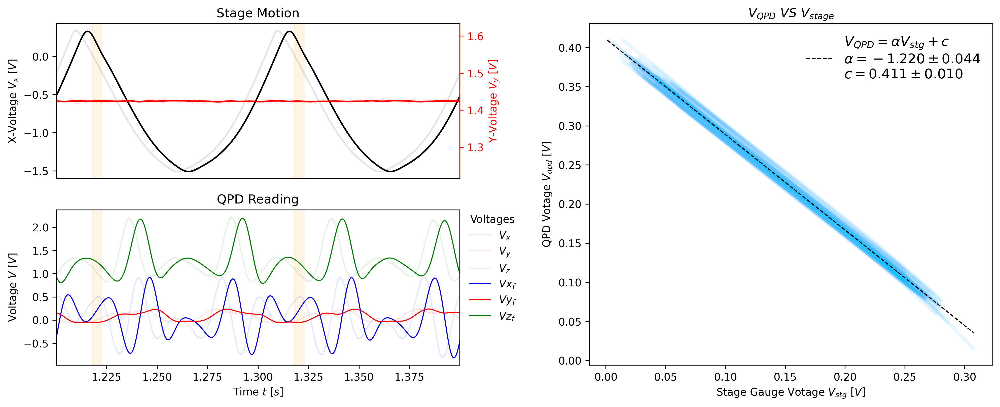

In [9]:
# This code will plot everything for a single dataset

def plot_single_dataset_X(data, t0=t0,t1=t1, fc=100,order=1,grad_min = 0.19, grad_max = 0.25, time_max=0.001, time_min = 0):

    # Get the variables
    time    = np.linspace(0,5,len(data[0]))
    stage_x = data[3]
    stage_y = data[4]
    x_raw   = data[0]
    y_raw   = data[1]
    z_raw   = data[2]
    fs = len(time)/(max(time)-min(time))


    # DO THE DATA ANALYSIS ##############################################################################

    # Obtain the linear regions
    qpd_supp, stg_supp, pairs = split(x_raw, stage_x, time, fc=fc, order=order, grad_min=grad_min, grad_max=grad_max, time_max=time_max, time_min=time_min)


    # Filter the data
    x_f_full = butter_lowpass_filter(x_raw,fc,fs)
    y_f_full = butter_lowpass_filter(y_raw,fc,fs)
    z_f_full = butter_lowpass_filter(z_raw,fc,fs)
    x_stg_f_full = butter_lowpass_filter(stage_x,fc,fs)
    y_stg_f_full = butter_lowpass_filter(stage_y,fc,fs)


    # Now we are going to fit the superposition and get their average
    M = []
    C = []

    # Get all the fits 
    for i in range(len(pairs)):
        mi, ci = np.polyfit(stg_supp[i],qpd_supp[i],1)
        M.append(mi)
        C.append(ci)

    # Get the parameters with uncertainties
    m = np.mean(M)
    m_std = np.std(M)
    c = np.mean(C)
    c_std = np.std(C)

    # Create a fit function
    fit = lambda x: m*x+c


    # PLOT THE IMAGE ####################################################################################

    # pick a time interval
    Arrays = [x_raw,y_raw,z_raw,stage_x,stage_y,x_f_full,y_f_full,z_f_full,x_stg_f_full,y_stg_f_full]
    t, x, y, z, x_stg, y_stg, x_f, y_f, z_f, x_stg_f, y_stg_f = get_interval(t0, t1, time.tolist(), [a.tolist() for a in Arrays])

    # Create the figure
    fig = plt.figure(figsize = (16,6), constrained_layout = False,dpi = 300)
    gs = fig.add_gridspec(2,2,wspace=0.32)          # Defines the grid

    # Plot the stage voltage ########################################
    ax_stg = fig.add_subplot(gs[0,0])
    ax_stg.set_title('Stage Motion')
    ax_stg.set_xlim(min(t),max(t))

    # Plot V_x
    ax_stg.plot(t,x_stg,c='k',alpha=0.1)
    ax_stg.plot(t,x_stg_f,c='k')
    ax_stg.set_ylabel(r'X-Voltage $V_x\ [V]$')
    ax_stg.get_xaxis().set_visible(False)

    #Plot V_y
    ax_stgy = ax_stg.twinx()
    ax_stgy.plot(t,y_stg,c='r',alpha=0.1)
    ax_stgy.plot(t,y_stg_f,c='r')
    scale_y = 0.2
    ax_stgy.set_ylim(min(stage_y)-scale_y,max(stage_y)+scale_y)

    ax_stgy.spines['right'].set_color('red')
    ax_stgy.tick_params(axis='y', colors ='red')
    ax_stgy.set_ylabel(r'Y-Voltage $V_y\ [V]$',c='red')


    # Plot QPD Signal ###############################################
    ax_qpd = fig.add_subplot(gs[1,0],sharex = ax_stg)
    ax_qpd.set_title('QPD Reading')
    ax_qpd.set_xlabel(r'Time $t\ [s]$')
    ax_qpd.set_ylabel(r'Voltage $V\ [V]$')

    # QPD Unfiltered signal
    ax_qpd.plot(t,x,c='b',label=r'$V_x$',lw=1,alpha=0.1)
    ax_qpd.plot(t,y,c='r',label=r'$V_y$',lw=1,alpha=0.1)
    ax_qpd.plot(t,z,c='g',label=r'$V_z$',lw=1,alpha=0.1)

    # QPD Filtered Signal
    ax_qpd.plot(t,x_f,c='b',label=r'$Vx_f$',lw=1)
    ax_qpd.plot(t,y_f,c='r',label=r'$Vy_f$',lw=1)
    ax_qpd.plot(t,z_f,c='g',label=r'$Vz_f$',lw=1)

    # Shade the identified region
    pair_interval = get_pair_interval(t0,t1,pairs_rising,time)
    # ax_qpd.vlines(time[pair_interval.flatten()],-1,1,color='orange')
    for pair in pair_interval:
        ax_qpd.axvspan(time[pair[0]],time[pair[1]],color='orange',alpha = 0.1)
        ax_stg.axvspan(time[pair[0]],time[pair[1]],color='orange',alpha = 0.1)


    ax_qpd.legend(title='Voltages', bbox_to_anchor=(1., 1.03), loc='upper left',frameon=False)

    # Plot Vqpd VS Vstg ###############################################
    ax_vv = fig.add_subplot(gs[:,1])
    ax_vv.set_title(r'$V_{QPD}\ VS\ V_{stage}$')
    ax_vv.set_xlabel(r'Stage Gauge Votage $V_{stg}\ [V]$')
    ax_vv.set_ylabel(r'QPD Votage $V_{qpd}\ [V]$')

    # Plot all the lines
    for i in range(len(pairs)):
        ax_vv.plot(stg_supp[i],qpd_supp[i],'.',c='deepskyblue',alpha=0.01)

    # Plot the fit on top

    # print((np.array(stg_supp).flatten()))
    min_V = min([min(stg) for stg in stg_supp])
    max_V = max([max(stg) for stg in stg_supp])
    V = np.linspace(min_V,max_V,1000)
    ax_vv.plot(V,fit(V),c='k',lw=1, ls='--',
        label=r"$V_{QPD} = \alpha V_{stg} + c$ "+"\n"+
              r"$\alpha = %.3f \pm %.3f$"%(m,m_std)+"\n"+
              r"$c = %.3f \pm %.3f$"%(c,c_std))

    ax_vv.legend(fontsize=13,frameon=False)

plot_single_dataset_X(data,t0=1.2,t1=1.4)